# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 26.03.2025

Мягкий дедлайн: 13.04.2025 23:59 MSK

Жёсткий дедлайн: 17.04.2025 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи).

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning.



In [3]:
import pandas as pd
import numpy as np
from numpy.linalg import eigh
from sklearn.cluster import KMeans

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

In [4]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [5]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        D = np.diag(np.sum(X, axis=1))
        L = D - X
        eigvals, eigvecs = eigh(L)
        return eigvecs[:, :self.n_components]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [6]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Альтернативная ссылка: [отсюда](https://disk.yandex.ru/i/J0HlcDXd_KyIeg). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [7]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [8]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
# map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [9]:
from collections import defaultdict

In [10]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    routes = defaultdict(list)
    for idx, row in data.iterrows():
        buses = row['RouteNumbers_en'].replace(' ', '').split(';')
        for bus_route in buses:
          routes[bus_route].append(idx)
    return routes


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    sorted_routes = {}

    for route, stations in routes.items():
        n = len(stations)
        if n < 2:
            sorted_routes[route] = stations
            continue

        dists = np.zeros((n, n))
        for i in range(n):
            row_i = data.iloc[stations[i]]
            x_i, y_i = row_i['Longitude_WGS84_en'], row_i['Latitude_WGS84_en']
            for j in range(n):
                if i != j:
                    row_j = data.iloc[stations[j]]
                    x_j, y_j = row_j['Longitude_WGS84_en'], row_j['Latitude_WGS84_en']
                    dists[i, j] = np.sqrt((x_i - x_j)**2 + (y_i - y_j)**2)

        sum_dists = np.sum(dists, axis=1)
        current_idx = np.argmax(sum_dists)
        visited = {current_idx}
        path = [stations[current_idx]]

        for _ in range(n - 1):
            nearest_candidates = np.argsort(dists[current_idx])
            for candidate in nearest_candidates:
                if candidate not in visited and candidate != current_idx:
                    visited.add(candidate)
                    path.append(stations[candidate])
                    current_idx = candidate
                    break

        sorted_routes[route] = path

    return sorted_routes


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    n_samples = data.shape[0]
    adjacency = np.zeros((n_samples, n_samples), dtype=int)

    for route_stations in sorted_routes.values():
        for i in range(len(route_stations) - 1):
            a = route_stations[i]
            b = route_stations[i + 1]
            adjacency[a, b] += 1
            adjacency[b, a] += 1

    np.fill_diagonal(adjacency, 0)
    return adjacency

In [11]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [12]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [13]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    n_clusters = max(labels) + 1
    colors = [f'#{np.random.randint(0, 0xFFFFFF):06x}' for _ in range(n_clusters)]

    fmap = folium.Map(location=[55.75215, 37.61819], zoom_start=12)

    for i, row in enumerate(data.itertuples()):
        folium.CircleMarker(
            location=[row.Latitude_WGS84_en, row.Longitude_WGS84_en],
            radius=4,
            color=colors[labels[i]],
            fill=True,
            fill_color=colors[labels[i]],
            fill_opacity=0.8
        ).add_to(fmap)

    return fmap

In [14]:
coords = data[['Latitude_WGS84_en', 'Longitude_WGS84_en']].values

In [15]:
clustering = GraphClustering(n_clusters=35, random_state=42)
labels = clustering.fit_predict(adjacency_matrix)

draw_clustered_map(data, labels)

In [16]:
kmeans = KMeans(n_clusters=35, random_state=42)
labels = kmeans.fit_predict(coords)
draw_clustered_map(data, labels)

In [17]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.003, min_samples=5)
labels = dbscan.fit_predict(coords)

draw_clustered_map(data, labels)

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации и подберите гиперпараметры так, чтобы кластеры получились осмысленными (нет такого, что все принадлежит одному кластеру или большая часть точек это шум):
- `sklearn.clustering.KMeans` - `n_clusters`
- `sklearn.clustering.DBSCAN` - `eps`
- ваш `SpectralClustering` - `n_clusters` и `n_components`

Для ряда алгоритмов, в частности DBSCAN, подобрать оптимальные параметры может быть ой, как непросто. Чтобы помочь сохранить нервные клетки рекомендуется пользоваться метриками Intrinsic Evaluation для кластеризации. Для каждого алгоритма скорее всего придется брать разные метрики, а может быть оптимизировать сразу несколько.

Ваша задача - выбрать подходящую метрику, можно взять что-то из списка ниже, можно спросить у гугла. Применить GridSearch, `optuna` или `hyperopt` и желательно завернуть отбор параметров в функцию, пригодится далее

1. $
   \text{Calinski-Harabasz Index} \in [0, \inf] = \frac{\sum_{i=1}^k BCSS_i/(k-1)}{\sum_{i=1}^k WCSS_i/(n-k)} = \frac{\sum_{i=1}^k n_i \| \mathbf{c}_i - \mathbf{c} \|^2/(k-1)}{\sum_{i=1}^k \sum_{\mathbf{x} \in C_i} \|\mathbf{x} - \mathbf{c}_i\|^2/(n-k)} \rightarrow max
   $
   - Отношение 1) расстояния от центра кластера до центра всех данных к 2) расстоянию от центра кластера до точки
   - Чем однороднее и дальше друг от друга кластеры, тем лучше
2. $
   \text{Silhouette Score} \in [0, 1] = \sum_i \frac{b_i - a_i}{\max(a_i, b_i)} \rightarrow max
   $
   - $a_i$ - среднее расстояние до точек внутри своего кластера
   - $b_i$ - среднее расстояние до точек из ближайшего кластера
   - Если в своем кластере точки близко - кластер плотный, идеальный вариант, скор равен 1, если свой кластер совпадает с соседним - кластеры неразделимы, скор равен нулю
   - Чем однороднее и разделимее кластеры, тем лучше
3. $\text{Davies-Bouldin Index} \in [0, inf] = \frac{1}{k} \sum_{i=1}^{k} \max_{j \neq i} \left( \frac{WCSS_i + WCSS_j}{d(c_i, c_j)} \right) \rightarrow min $
   - Отношение внутрикластерных расстояний к межкластерному расстоянию между двумя центрами
   - Если кластеры далеко друг от друга, но при этом однородные, скор наименьший
3. $\text{Elbow Method}$ - последовательное сравнение $WCSS$ из пункта 1 для разного числа параметров. Если уменьшение меньше определенного порога - останавливаемся, считаем это значение оптимальным

In [18]:
!pip install -q optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 231.9/231.9 kB 13.8 MB/s eta 0:00:00


In [19]:
import optuna
from sklearn.metrics import silhouette_score

def clustering_objective(trial, coords, method, adjacency_matrix=None):
  if method == 'kmeans':
    n_clusters = trial.suggest_int("n_clusters", 2, 100)
    model = KMeans(n_clusters=n_clusters, random_state=42)
    labels = model.fit_predict(coords)

  elif method == 'dbscan':
      eps = trial.suggest_float("eps", 0.001, 0.01, log=True)
      min_samples = trial.suggest_int("min_samples", 3, 20)
      model = DBSCAN(eps=eps, min_samples=min_samples)
      labels = model.fit_predict(coords)
  elif method == 'spectral':
      if adjacency_matrix is None:
          raise ValueError("Для spectral clustering требуется adjacency_matrix")

      n_clusters = trial.suggest_int("n_clusters", 2, 100)
      n_components = trial.suggest_int("n_components", n_clusters, min(n_clusters + 10, adjacency_matrix.shape[0] - 1))

      model = GraphClustering(n_clusters=n_clusters, n_components=n_components, random_state=42)
      labels = model.fit_predict(adjacency_matrix)

  if len(set(labels)) < 2:
      return -1.0

  return silhouette_score(coords, labels)

In [20]:
study_k = optuna.create_study(direction='maximize')
study_k.optimize(lambda trial: clustering_objective(trial, coords, method='kmeans'), n_trials=10)

[I 2025-04-17 17:24:24,003] A new study created in memory with name: no-name-2f3277a2-ae8d-4a4d-b43f-3c1624ba4afc
[I 2025-04-17 17:24:24,149] Trial 0 finished with value: 0.40621944261110093 and parameters: {'n_clusters': 41}. Best is trial 0 with value: 0.40621944261110093.
[I 2025-04-17 17:24:24,270] Trial 1 finished with value: 0.39584398591017267 and parameters: {'n_clusters': 45}. Best is trial 0 with value: 0.40621944261110093.
[I 2025-04-17 17:24:24,306] Trial 2 finished with value: 0.3970848657018594 and parameters: {'n_clusters': 11}. Best is trial 0 with value: 0.40621944261110093.
[I 2025-04-17 17:24:24,358] Trial 3 finished with value: 0.40678205243619214 and parameters: {'n_clusters': 51}. Best is trial 3 with value: 0.40678205243619214.
[I 2025-04-17 17:24:24,424] Trial 4 finished with value: 0.4248697269400299 and parameters: {'n_clusters': 88}. Best is trial 4 with value: 0.4248697269400299.
[I 2025-04-17 17:24:24,482] Trial 5 finished with value: 0.4181166142477204 and

In [21]:
study_k.best_params["n_clusters"]

87

In [22]:
km = KMeans(n_clusters=study_k.best_params["n_clusters"], random_state=42)
labels = km.fit_predict(coords)
draw_clustered_map(data, labels)

In [23]:
study_db = optuna.create_study(direction='maximize')
study_db.optimize(lambda trial: clustering_objective(trial, coords, method='dbscan'), n_trials=10)

[I 2025-04-17 17:24:25,499] A new study created in memory with name: no-name-7d76f0dd-8bb5-43ca-923b-d552d63b94a2
[I 2025-04-17 17:24:25,552] Trial 0 finished with value: -0.2516903672975181 and parameters: {'eps': 0.0018097270047559113, 'min_samples': 4}. Best is trial 0 with value: -0.2516903672975181.
[I 2025-04-17 17:24:25,674] Trial 1 finished with value: 0.2673203145581509 and parameters: {'eps': 0.009673529553606647, 'min_samples': 9}. Best is trial 1 with value: 0.2673203145581509.
[I 2025-04-17 17:24:25,753] Trial 2 finished with value: 0.335052715446048 and parameters: {'eps': 0.007799272608473313, 'min_samples': 3}. Best is trial 2 with value: 0.335052715446048.
[I 2025-04-17 17:24:25,768] Trial 3 finished with value: -1.0 and parameters: {'eps': 0.0012062384789570193, 'min_samples': 17}. Best is trial 2 with value: 0.335052715446048.
[I 2025-04-17 17:24:25,804] Trial 4 finished with value: -0.42662137425117946 and parameters: {'eps': 0.001047266886075583, 'min_samples': 3}.

In [24]:
study_db.best_params["eps"]

0.007799272608473313

In [25]:
dbscan = DBSCAN(eps=study_db.best_params["eps"])
labels = dbscan.fit_predict(coords)
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
print(f"Число кластеров: {n_clusters}")

Число кластеров: 1


In [26]:
draw_clustered_map(data, labels)

In [27]:
study_spectral = optuna.create_study(direction='maximize')
study_spectral.optimize(lambda trial: clustering_objective(trial, coords, method='spectral', adjacency_matrix=adjacency_matrix), n_trials=10)

[I 2025-04-17 17:24:27,104] A new study created in memory with name: no-name-e410dece-bf08-47d7-8e1d-c4e280e3a314
[I 2025-04-17 17:24:29,156] Trial 0 finished with value: -0.08447729453596976 and parameters: {'n_clusters': 24, 'n_components': 24}. Best is trial 0 with value: -0.08447729453596976.
[I 2025-04-17 17:24:31,014] Trial 1 finished with value: -0.047101831937026224 and parameters: {'n_clusters': 51, 'n_components': 59}. Best is trial 1 with value: -0.047101831937026224.
[I 2025-04-17 17:24:33,001] Trial 2 finished with value: -0.21231829693053023 and parameters: {'n_clusters': 21, 'n_components': 28}. Best is trial 1 with value: -0.047101831937026224.
[I 2025-04-17 17:24:36,011] Trial 3 finished with value: -0.023867905273657824 and parameters: {'n_clusters': 11, 'n_components': 15}. Best is trial 3 with value: -0.023867905273657824.
[I 2025-04-17 17:24:39,560] Trial 4 finished with value: 0.2639142371973658 and parameters: {'n_clusters': 3, 'n_components': 10}. Best is trial 

In [28]:
study_spectral.best_params["n_clusters"]

3

In [29]:
clustering = GraphClustering(n_clusters=study_spectral.best_params["n_clusters"], random_state=42)
labels = clustering.fit_predict(adjacency_matrix)

draw_clustered_map(data, labels)

Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`.

**Вопрос:** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

**k-means**

Плюсы:
* Можно получить заданное количество кластеров — удобно, если нужно, например, разбить город на районы.

Минусы:
* Не учитывает маршруты автобусов — точки объединяются по координатам, а не по логике сети.
* Плохо обрабатывает вытянутые формы (например, линии транспорта).

**DBSCAN**

Плюсы:
* Подходит для вытянутых, извилистых маршрутов.

Минусы:
* Eps слишком большой — алгоритм считает, что все точки достаточно близко друг к другу, и объединит их в один кластер.
* Для кластеризации остановок, особенно если они равномерно расположены, DBSCAN не всегда работает хорошо "из коробки" и требует тонкой настройки.

**Спектральная кластеризация**

Плюсы:
* Учитывает связи маршрутов, формирует вытянутые/цепные кластеры. Норм работает.

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [30]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
878,entertainment,369.txt,Briton wins short film Oscar,Three of the five nominees in the live-action...
1817,sport,505.txt,Soderling wins tense Milan final,Fifth seed Robin Soderling took the Milan Ind...
658,entertainment,149.txt,Spector facing more legal action,Music producer Phil Spector is facing legal a...
1672,sport,360.txt,Player burn-out worries Robinson,England coach Andy Robinson says English rugb...
147,business,148.txt,Alfa Romeos 'to get GM engines',Fiat is to stop making six-cylinder petrol en...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [31]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [32]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [33]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [34]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [35]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [36]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

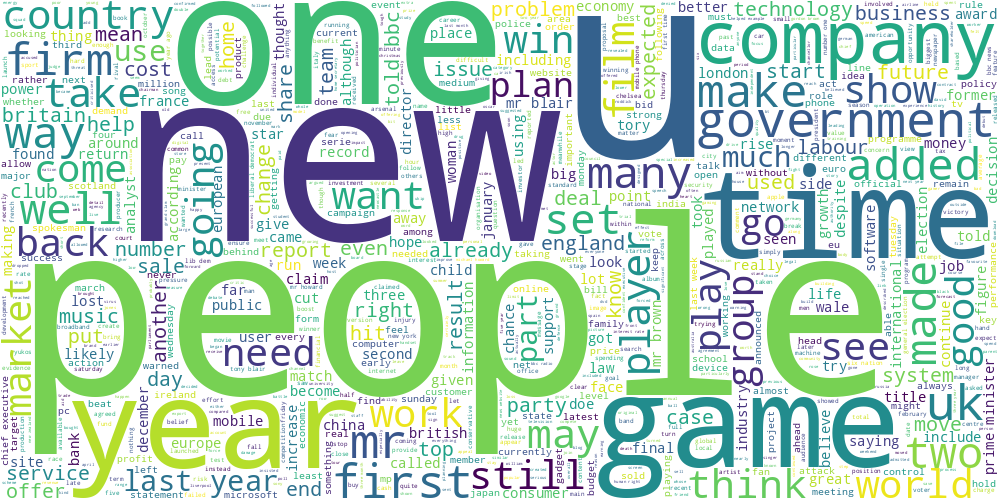

In [37]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров.

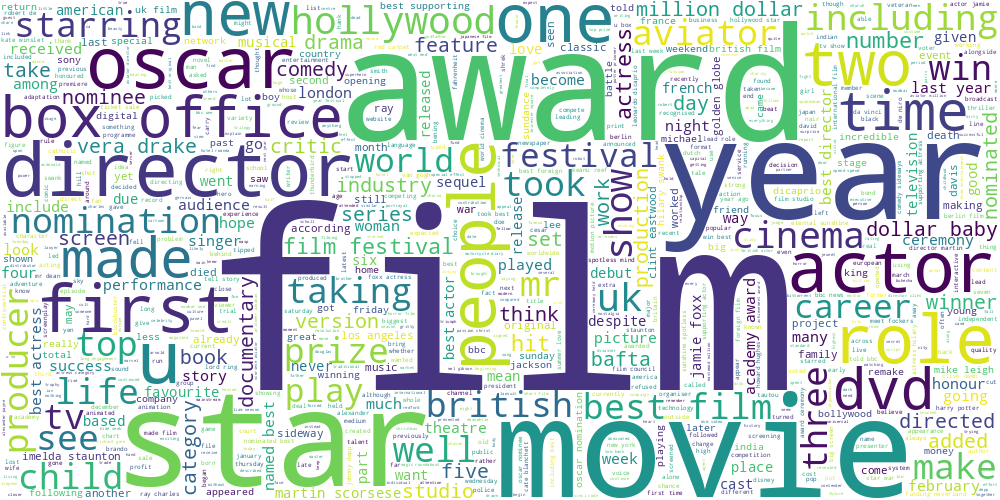

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

vectorizer = TfidfVectorizer(min_df=0.1, max_df=0.9, stop_words='english')
X = vectorizer.fit_transform(data.text)

kmeans = KMeans(n_clusters=8, random_state=42, n_init='auto')
labels = kmeans.fit_predict(X)

data['cluster'] = labels

draw_wordcloud(data[data['cluster'] == 0].text)

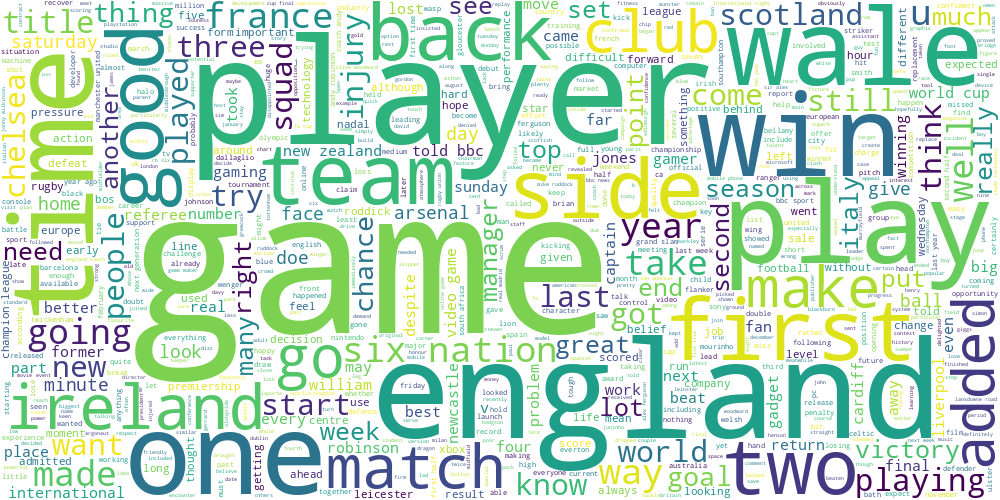

In [39]:
draw_wordcloud(data[data['cluster'] == 1].text)

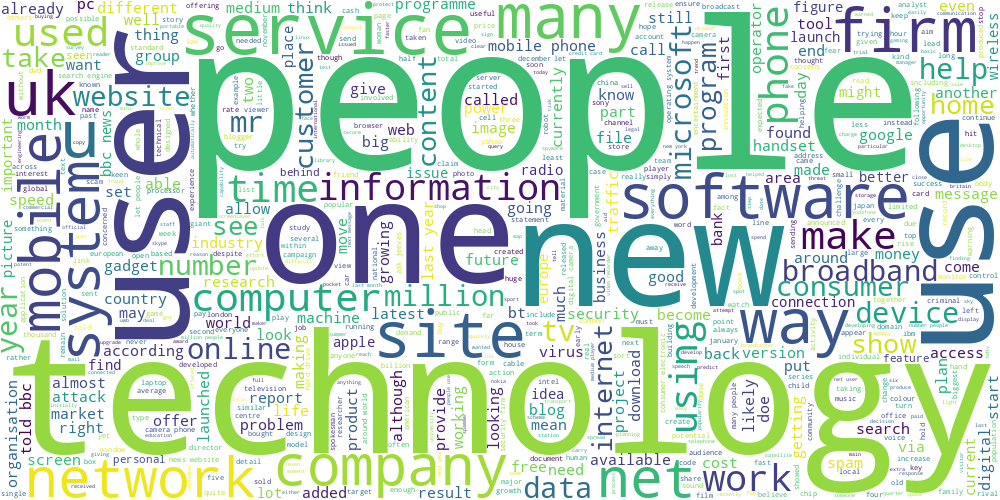

In [40]:
draw_wordcloud(data[data['cluster'] == 2].text)

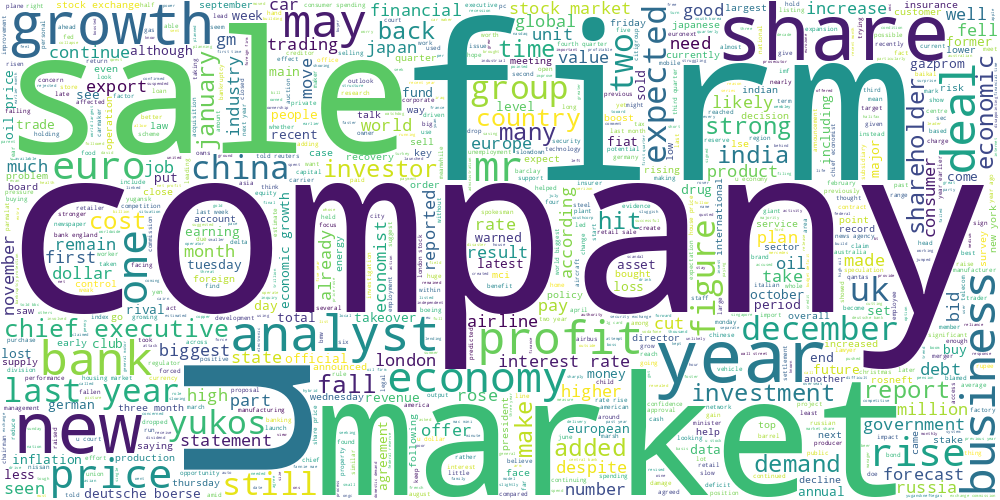

In [41]:
draw_wordcloud(data[data['cluster'] == 3].text)

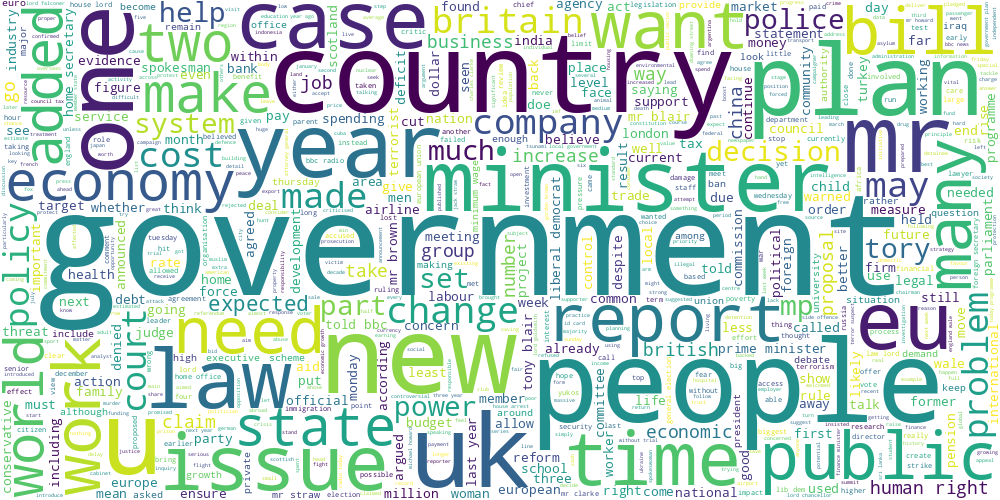

In [42]:
draw_wordcloud(data[data['cluster'] == 4].text)

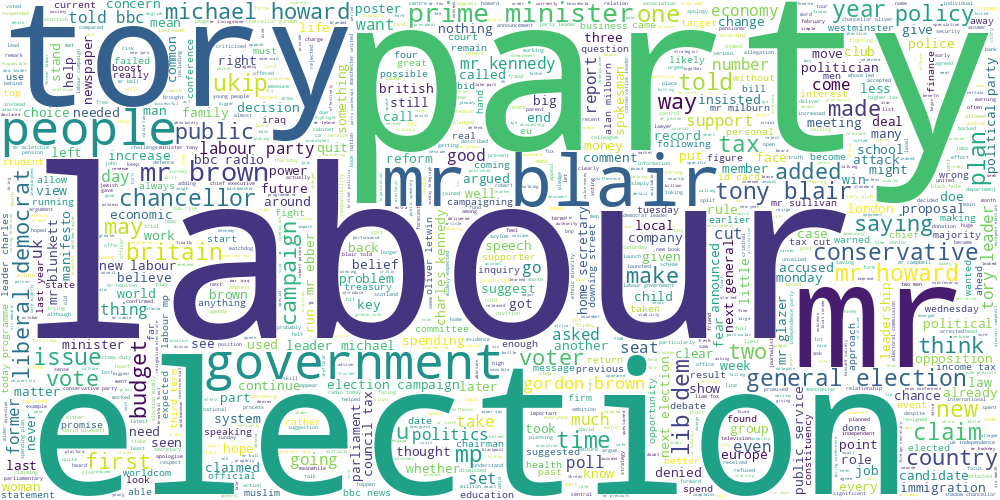

In [43]:
draw_wordcloud(data[data['cluster'] == 5].text)

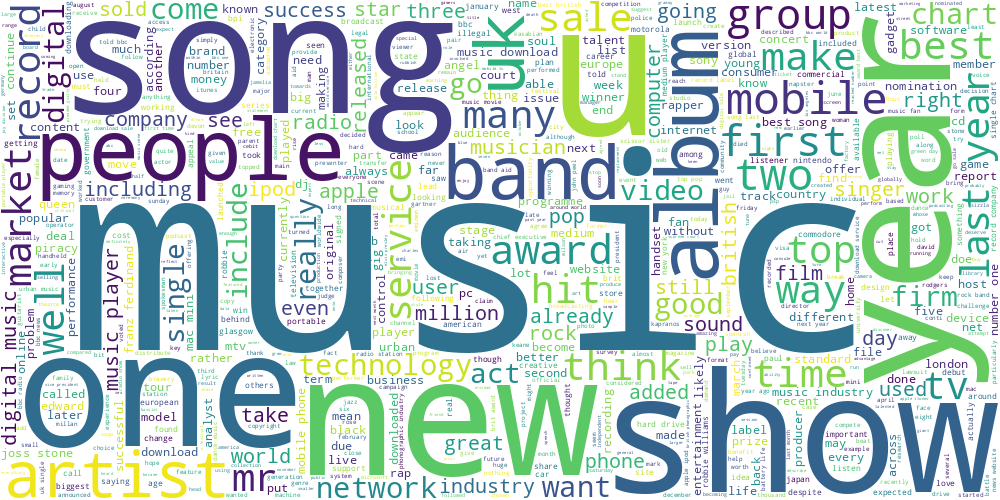

In [44]:
draw_wordcloud(data[data['cluster'] == 6].text)

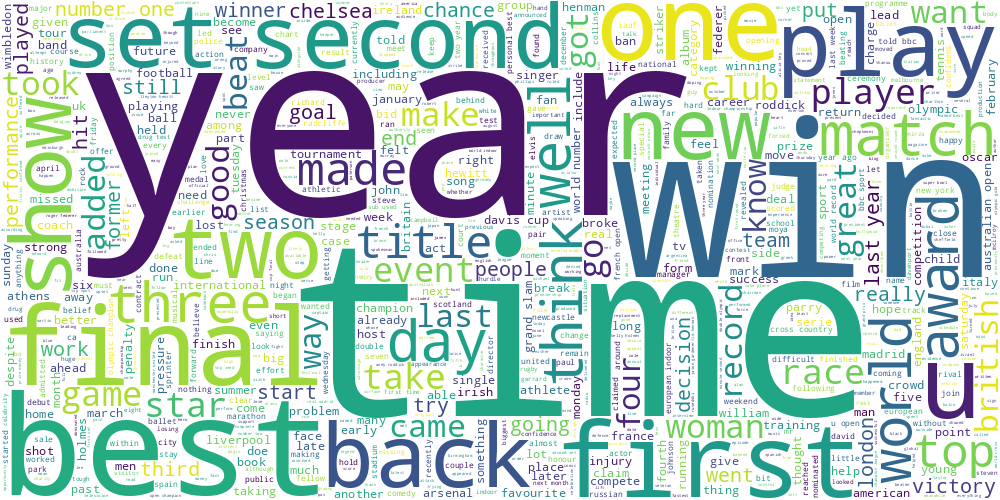

In [45]:
draw_wordcloud(data[data['cluster'] == 7].text)

Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

**Кластер 0** - экономика и бизнес, рынки и торговля, банки, фирмы.

**Кластер 1** - политика и право, закон и государство, международные отношения.

**Кластер 2** - что-то про Великобританию и Тони Блэра.

**Кластер 3** - Юкос, Газпром, торговля, выручка и прибыль, акционеры - финансовая тема.

**Кластер 4** - евро и Европа, рынки, рост цен, экономический рост.

**Кластер 5** - про Голливуд: Оскар, фильмы и актеры, призы, жанры, киноиндеустрия.

**Кластер 6** - игры, футбол, национальные соревнования, победы, травмы.

**Кластер 7** - трудоустройство, выборы, политика, партии, иммиграция.


**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны.

In [46]:
import numpy as np

def print_top_keywords_per_cluster(kmeans, vectorizer, top_n=10):
    feature_names = vectorizer.get_feature_names_out()
    cluster_centers = kmeans.cluster_centers_

    for i, center in enumerate(cluster_centers):
        top_indices = center.argsort()[::-1][:top_n]
        top_keywords = [feature_names[idx] for idx in top_indices]
        print(f"Кластер {i}:")
        print(", ".join(top_keywords))

In [47]:
print_top_keywords_per_cluster(kmeans, vectorizer, top_n=10)

Кластер 0:
film, best, star, director, year, office, including, new, life, taking
Кластер 1:
game, england, player, win, team, play, time, good, got, chance
Кластер 2:
people, technology, service, use, firm, new, website, mr, used, using
Кластер 3:
company, firm, market, share, sale, growth, year, price, analyst, deal
Кластер 4:
government, mr, minister, country, plan, people, year, case, public, new
Кластер 5:
mr, labour, election, party, minister, leader, government, people, told, plan
Кластер 6:
music, year, record, new, uk, sale, group, hit, industry, best
Кластер 7:
year, world, best, open, final, second, win, set, time, star


Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** Да, аххахх, все примерно так же как я написала в номере выше.

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров (подумайте, как это можно сделать)

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [48]:
from sklearn.cluster import DBSCAN

for eps in np.arange(0.5, 1.0, 0.025):
    dbscan = DBSCAN(eps=eps, min_samples=5)
    labels = dbscan.fit_predict(X)

    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    print(f"eps = {eps:.2f} → кластеров: {n_clusters}")

eps = 0.50 → кластеров: 2
eps = 0.53 → кластеров: 4
eps = 0.55 → кластеров: 6
eps = 0.58 → кластеров: 9
eps = 0.60 → кластеров: 10
eps = 0.63 → кластеров: 11
eps = 0.65 → кластеров: 12
eps = 0.68 → кластеров: 15
eps = 0.70 → кластеров: 15
eps = 0.73 → кластеров: 16
eps = 0.75 → кластеров: 15
eps = 0.78 → кластеров: 18
eps = 0.80 → кластеров: 20
eps = 0.83 → кластеров: 22
eps = 0.85 → кластеров: 19
eps = 0.88 → кластеров: 16
eps = 0.90 → кластеров: 12
eps = 0.93 → кластеров: 9
eps = 0.95 → кластеров: 6
eps = 0.98 → кластеров: 5


8 кластеров при значении eps = 0.83

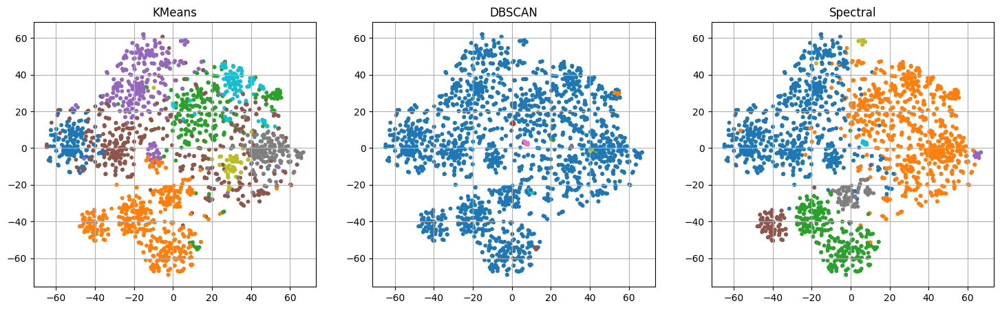

In [49]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans, DBSCAN, SpectralClustering
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

vectorizer = TfidfVectorizer(min_df=5, max_df=0.9, stop_words='english')
X = vectorizer.fit_transform(data.text)

n_clusters = 8
labels_kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit_predict(X)
labels_dbscan = DBSCAN(eps=0.83, min_samples=5).fit_predict(X)
labels_spectral = SpectralClustering(n_clusters=n_clusters, random_state=42, affinity='nearest_neighbors').fit_predict(X.toarray())

X_2d = TSNE(n_components=2, random_state=0).fit_transform(X.toarray())

plt.figure(figsize=(18, 5))

for i, (labels, title) in enumerate([
    (labels_kmeans, "KMeans"),
    (labels_dbscan, "DBSCAN"),
    (labels_spectral, "Spectral")
]):
    plt.subplot(1, 3, i + 1)
    plt.scatter(X_2d[:, 0], X_2d[:, 1], c=labels, cmap='tab10', s=10)
    plt.title(title)
    plt.grid(True)

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**

KMeans показал похожее на первый номер поведение: компактные и равномерные группы, легко интерпретируемые. DBSCAN снова сработал хуже — слишком чувствителен к параметрам, в текстах часто сливается в один кластер, впрочем в первом номере наблюдали похожую картину. Spectral Clustering — как и в геоданных, выделяет сложные формы, интересен, но может давать перекос в сторону одного большого кластера.

В общем, однозначно хуже всех с задачей справился DBSCAN.

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means.

In [50]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import numpy as np

vectorizer = CountVectorizer(min_df=5, max_df=0.9, stop_words='english')
X_bow = vectorizer.fit_transform(data.text)

n_topics = 16  # до этого было 8 кластеров в KMeans, теперь 2x = 16
lda = LatentDirichletAllocation(n_components=n_topics, random_state=0)
lda_topic_distributions = lda.fit_transform(X_bow)

data['lda_topic'] = np.argmax(lda_topic_distributions, axis=1)

In [51]:
feature_names = vectorizer.get_feature_names_out()
for topic_idx in range(16):
  top_indices = lda.components_[topic_idx].argsort()[::-1][:10]
  top_words = [feature_names[i] for i in top_indices]
  print(f"Центральные слова темы: {topic_idx}", ", ".join(top_words))

Центральные слова темы: 0 year, best, music, world, band, song, record, award, new, album
Центральные слова темы: 1 people, time, day, music, year, star, best, british, hunting, tsunami
Центральные слова темы: 2 mr, court, case, law, company, charge, trial, lord, decision, drug
Центральные слова темы: 3 year, market, price, growth, company, economy, sale, firm, rate, share
Центральные слова темы: 4 wale, ireland, scotland, italy, williams, jones, nation, rugby, france, zealand
Центральные слова темы: 5 open, set, match, win, world, year, bid, australian, roddick, final
Центральные слова темы: 6 site, user, software, people, security, net, search, computer, program, firm
Центральные слова темы: 7 game, people, technology, music, digital, mr, player, video, new, online
Центральные слова темы: 8 people, government, new, council, law, work, minister, report, european, problem
Центральные слова темы: 9 film, award, best, year, star, actor, director, movie, oscar, new
Центральные слова темы:

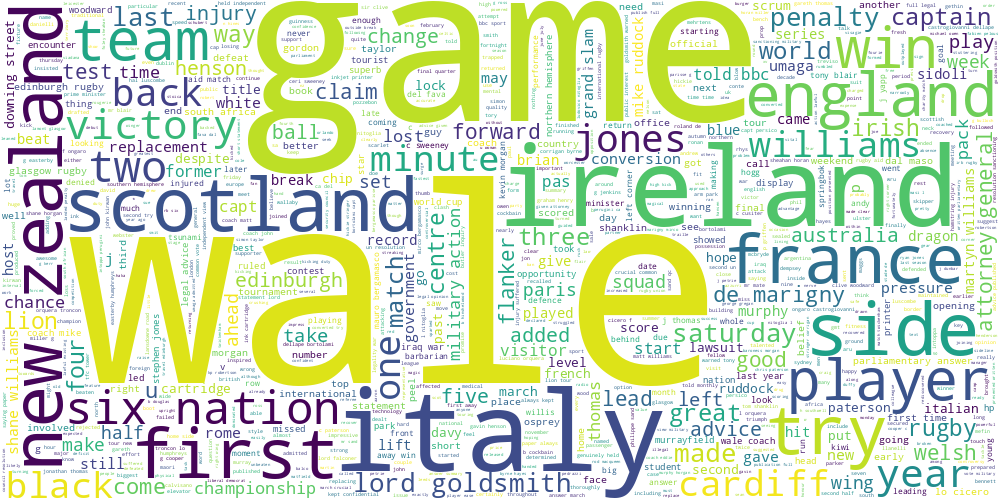

In [52]:
draw_wordcloud(data[data['lda_topic'] == 4].text)

Тема 4: население, труд, партии, выборы и государство, закон - достаточно четкий набор, многие слова связаны с государственным регулированием, видна налоговая повестка, религиозная (мусульмане и иммиграция), социальная (образование, университеты).

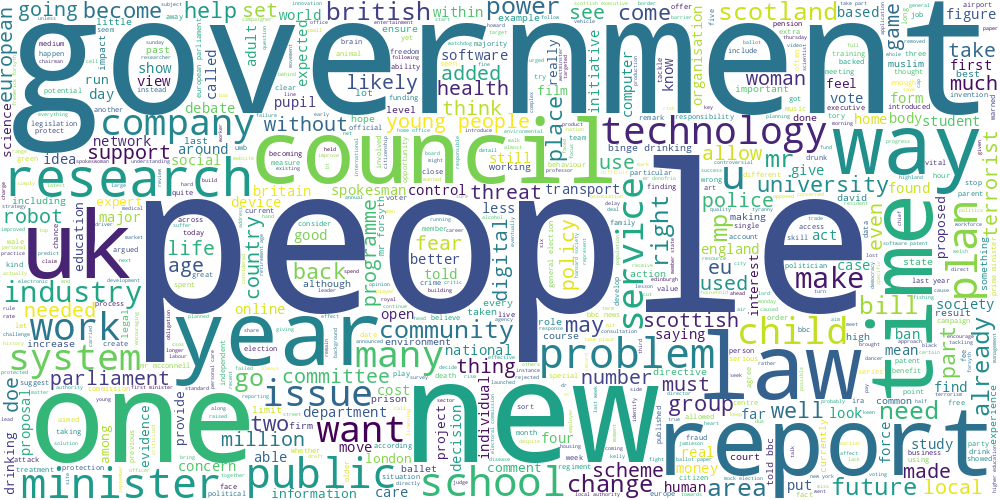

In [53]:
draw_wordcloud(data[data['lda_topic'] == 8].text)

Тема 8: тут немного про спорт, чемпионаты и результаты матчей, так же много инфы про игроков и клубы. Все четко, вопросов нет к содержимому, все очень по теме.

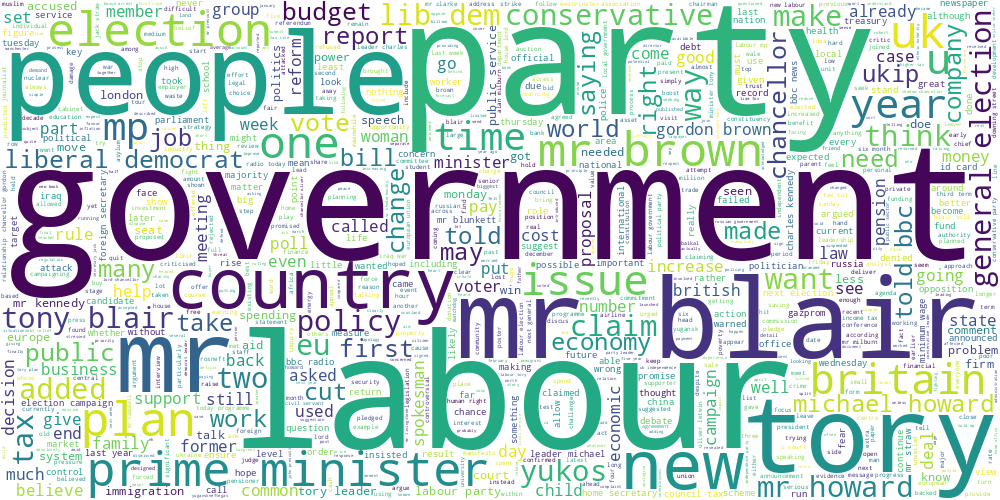

In [54]:
draw_wordcloud(data[data['lda_topic'] == 15].text)

Тема 15: экономика, бизнес и корпоративные финансы. Здесь
новости о компаниях и слияниях, про акции, рынки, инвестиции и тд.
Упоминаются госорганы и регулирование. Тема четко отражает блок деловых и финансовых новостей.

Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** Да, в целом получилось, но немного странно, что в теме 14 переплелись нефтяной сектор и Юкос с темой киноиндустрии и номинацией на Оскар. В остальных случаях все ок, появились специализированные темы, подходящие для тематического анализа.

## Часть 3. Transfer learning и Self-Supervised Learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [55]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import LatentDirichletAllocation

In [56]:
X_train, X_test, y_train, y_test = train_test_split(data.text, data.category, test_size=0.2, random_state=42)

In [57]:
tfidf = TfidfVectorizer()
X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfidf = tfidf.transform(X_test)

clf1 = LogisticRegression()
clf1.fit(X_train_tfidf, y_train)

print("TF-IDF + LogReg:")
print("Train acc:", clf1.score(X_train_tfidf, y_train))
print("Test  acc:", clf1.score(X_test_tfidf, y_test))

TF-IDF + LogReg:
Train acc: 0.998314606741573
Test  acc: 0.9685393258426966


In [58]:
kmeans = KMeans(random_state=42)
kmeans.fit(X_train_tfidf)
X_train_kmeans = kmeans.transform(X_train_tfidf)
X_test_kmeans = kmeans.transform(X_test_tfidf)

clf2 = LogisticRegression()
clf2.fit(X_train_kmeans, y_train)

print("\nKMeans + LogReg:")
print("Train acc:", clf2.score(X_train_kmeans, y_train))
print("Test  acc:", clf2.score(X_test_kmeans, y_test))


KMeans + LogReg:
Train acc: 0.8033707865168539
Test  acc: 0.8089887640449438


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [59]:
count = CountVectorizer()
X_train_bow = count.fit_transform(X_train)
X_test_bow = count.transform(X_test)

lda = LatentDirichletAllocation(random_state=42)
X_train_lda = lda.fit_transform(X_train_bow)
X_test_lda = lda.transform(X_test_bow)

clf3 = LogisticRegression()
clf3.fit(X_train_lda, y_train)

print("\nLDA + LogReg:")
print("Train acc:", clf3.score(X_train_lda, y_train))
print("Test  acc:", clf3.score(X_test_lda, y_test))


LDA + LogReg:
Train acc: 0.9393258426966292
Test  acc: 0.9550561797752809


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** TF-IDF + LogisticRegression показывает наилучшее качество, потому что использует всю текстовую информацию напрямую и не требует преобразований или тематических обобщений. У TF-IDF видно небольшое переобучение (train=0.99, test=0.96), но оно ожидаемо и допустимо.

KMeans преобразует текст в расстояния до центров кластеров, теряя смысловую нагрузку слов. Значение метрик так себе.

LDA даёт достойный результат — особенно в условиях ограниченных признаков. У LDA качество на тесте даже лучше, чем на трейне: это связано с тем, что unsupervised представления могут быть универсальными, а логрегрессия не переобучается на малом числе признаков (тем).


**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации.

In [61]:
X = data.text
y = data.category

X_trainval, X_test, y_trainval, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_labeled, X_rest, y_labeled, y_rest = train_test_split(X_trainval, y_trainval, test_size=0.95, random_state=42, stratify=y_trainval)
X_unlabeled, X_valid, y_unlabeled, y_valid = train_test_split(X_rest, y_rest, test_size=30/95, random_state=42, stratify=y_rest)

print("Размеченный train (5%):", len(X_labeled))
print("Неразмеченный train (65%):", len(X_unlabeled))
print("Валидация (30%):", len(X_valid))
print("Тест (30%):", len(X_test))

Размеченный train (5%): 77
Неразмеченный train (65%): 1012
Валидация (30%): 468
Тест (30%): 668


**Логистическая регрессия на tf-idf признаках**

In [63]:
from sklearn.feature_extraction.text import TfidfVectorizer

X_unsup = pd.concat([X_labeled, X_unlabeled])
tfidf = TfidfVectorizer(min_df=5, max_df=0.9, stop_words='english')

X_unsup_tfidf = tfidf.fit_transform(X_unsup)
X_labeled_tfidf = tfidf.transform(X_labeled)
X_valid_tfidf = tfidf.transform(X_valid)
X_test_tfidf = tfidf.transform(X_test)

In [113]:
from sklearn.metrics import accuracy_score

def objective(trial):
    C = trial.suggest_float("C", 1e-3, 10, log=True)

    clf = LogisticRegression(C=C, max_iter=1000)
    clf.fit(X_labeled_tfidf, y_labeled)
    preds = clf.predict(X_valid_tfidf)
    return accuracy_score(y_valid, preds)

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=10)
print("Best params:", study.best_params)

[I 2025-04-17 17:36:39,288] A new study created in memory with name: no-name-f6b7afad-91ca-45ff-b4d3-1bb57d6383f7
[I 2025-04-17 17:36:40,164] Trial 0 finished with value: 0.8055555555555556 and parameters: {'C': 0.843820215128921}. Best is trial 0 with value: 0.8055555555555556.
[I 2025-04-17 17:36:40,358] Trial 1 finished with value: 0.4551282051282051 and parameters: {'C': 0.04237811766373699}. Best is trial 0 with value: 0.8055555555555556.
[I 2025-04-17 17:36:40,581] Trial 2 finished with value: 0.7115384615384616 and parameters: {'C': 0.5068073062236859}. Best is trial 0 with value: 0.8055555555555556.
[I 2025-04-17 17:36:40,776] Trial 3 finished with value: 0.4551282051282051 and parameters: {'C': 0.01694089563902628}. Best is trial 0 with value: 0.8055555555555556.
[I 2025-04-17 17:36:41,043] Trial 4 finished with value: 0.8696581196581197 and parameters: {'C': 1.8260431191156516}. Best is trial 4 with value: 0.8696581196581197.
[I 2025-04-17 17:36:41,223] Trial 5 finished with 

Best params: {'C': 1.8260431191156516}


In [114]:
best = study.best_params
final_model = LogisticRegression(**best, max_iter=1000)
final_model.fit(X_labeled_tfidf, y_labeled)
print("Final test acc:", final_model.score(X_test_tfidf, y_test))

Final test acc: 0.8637724550898204


**K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров**

In [122]:
def kmeans_logreg_objective(trial):
    n_clusters = trial.suggest_int("n_clusters", 5, 50)
    C = trial.suggest_float("C", 1e-3, 10, log=True)
    fit_intercept = trial.suggest_categorical("fit_intercept", [True, False])
    class_weight = trial.suggest_categorical("class_weight", [None, "balanced"])

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(X_unsup_tfidf)

    X_labeled_km = kmeans.transform(X_labeled_tfidf)
    X_valid_km = kmeans.transform(X_valid_tfidf)

    clf = LogisticRegression(
        C=C,
        fit_intercept=fit_intercept,
        class_weight=class_weight,
        max_iter=1000
    )
    clf.fit(X_labeled_km, y_labeled)
    preds = clf.predict(X_valid_km)

    return accuracy_score(y_valid, preds)

In [123]:
study_km = optuna.create_study(direction="maximize")
study_km.optimize(kmeans_logreg_objective, n_trials=10)

print("Best params (KMeans + LogReg):", study_km.best_params)

[I 2025-04-17 17:41:38,228] A new study created in memory with name: no-name-5df28d0e-8afb-468f-9a3e-bf38a13470e1
[I 2025-04-17 17:41:38,409] Trial 0 finished with value: 0.22863247863247863 and parameters: {'n_clusters': 18, 'C': 0.004790230754147704, 'fit_intercept': False, 'class_weight': None}. Best is trial 0 with value: 0.22863247863247863.
[I 2025-04-17 17:41:38,792] Trial 1 finished with value: 0.3525641025641026 and parameters: {'n_clusters': 35, 'C': 0.0036041748982576847, 'fit_intercept': False, 'class_weight': 'balanced'}. Best is trial 1 with value: 0.3525641025641026.
[I 2025-04-17 17:41:38,906] Trial 2 finished with value: 0.7735042735042735 and parameters: {'n_clusters': 5, 'C': 4.073026674226639, 'fit_intercept': True, 'class_weight': 'balanced'}. Best is trial 2 with value: 0.7735042735042735.
[I 2025-04-17 17:41:39,042] Trial 3 finished with value: 0.22863247863247863 and parameters: {'n_clusters': 13, 'C': 0.009240334994553045, 'fit_intercept': False, 'class_weight'

Best params (KMeans + LogReg): {'n_clusters': 48, 'C': 6.653770063168864, 'fit_intercept': True, 'class_weight': 'balanced'}


In [124]:
params = study_km.best_params
kmeans = KMeans(n_clusters=params["n_clusters"], random_state=42)
kmeans.fit(X_unsup_tfidf)

X_labeled_km = kmeans.transform(X_labeled_tfidf)
X_test_km = kmeans.transform(X_test_tfidf)

final_clf = LogisticRegression(
    C=params["C"],
    fit_intercept=params["fit_intercept"],
    class_weight=params["class_weight"],
    max_iter=1000
)
final_clf.fit(X_labeled_km, y_labeled)

print("Test accuracy (KMeans + LogReg):", final_clf.score(X_test_km, y_test))

Test accuracy (KMeans + LogReg): 0.938622754491018


**Латентное размещение Дирихле + логистическая регрессия на вероятностях тем**

In [134]:
from sklearn.feature_extraction.text import CountVectorizer

X_unsup = pd.concat([X_labeled, X_unlabeled])

vectorizer = CountVectorizer(min_df=5, max_df=0.9, stop_words='english')
X_unsup_bow = vectorizer.fit_transform(X_unsup)
X_labeled_bow = vectorizer.transform(X_labeled)
X_valid_bow = vectorizer.transform(X_valid)
X_test_bow = vectorizer.transform(X_test)

In [136]:
def lda_logreg_objective(trial):
    n_topics = trial.suggest_int("n_components", 5, 50)
    C = trial.suggest_float("C", 1e-3, 10, log=True)
    fit_intercept = trial.suggest_categorical("fit_intercept", [True, False])
    class_weight = trial.suggest_categorical("class_weight", [None, "balanced"])

    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(X_unsup_bow)

    X_labeled_lda = lda.transform(X_labeled_bow)
    X_valid_lda = lda.transform(X_valid_bow)

    clf = LogisticRegression(
        C=C,
        fit_intercept=fit_intercept,
        class_weight=class_weight,
        max_iter=1000
    )
    clf.fit(X_labeled_lda, y_labeled)
    preds = clf.predict(X_valid_lda)

    return accuracy_score(y_valid, preds)

In [138]:
study_lda = optuna.create_study(direction="maximize")
study_lda.optimize(lda_logreg_objective, n_trials=10)

print("Best LDA + LogReg params:", study_lda.best_params)


[I 2025-04-17 17:47:48,841] A new study created in memory with name: no-name-fb086ec7-eca1-453e-8559-9dce30073876
[I 2025-04-17 17:47:57,611] Trial 0 finished with value: 0.8974358974358975 and parameters: {'n_components': 36, 'C': 1.089708878017916, 'fit_intercept': False, 'class_weight': 'balanced'}. Best is trial 0 with value: 0.8974358974358975.
[I 2025-04-17 17:48:06,042] Trial 1 finished with value: 0.8739316239316239 and parameters: {'n_components': 40, 'C': 0.0022821949638922355, 'fit_intercept': False, 'class_weight': 'balanced'}. Best is trial 0 with value: 0.8974358974358975.
[I 2025-04-17 17:48:13,715] Trial 2 finished with value: 0.8653846153846154 and parameters: {'n_components': 48, 'C': 0.8745782239158914, 'fit_intercept': True, 'class_weight': None}. Best is trial 0 with value: 0.8974358974358975.
[I 2025-04-17 17:48:20,603] Trial 3 finished with value: 0.9423076923076923 and parameters: {'n_components': 12, 'C': 0.04473558796570449, 'fit_intercept': True, 'class_weigh

Best LDA + LogReg params: {'n_components': 12, 'C': 0.04473558796570449, 'fit_intercept': True, 'class_weight': 'balanced'}


In [139]:
params = study_lda.best_params
lda = LatentDirichletAllocation(n_components=params["n_components"], random_state=42)
lda.fit(X_unsup_bow)

X_labeled_lda = lda.transform(X_labeled_bow)
X_test_lda = lda.transform(X_test_bow)

final_clf = LogisticRegression(
    C=params["C"],
    fit_intercept=params["fit_intercept"],
    class_weight=params["class_weight"],
    max_iter=1000
)
final_clf.fit(X_labeled_lda, y_labeled)

print("Test accuracy (LDA + LogReg):", final_clf.score(X_test_lda, y_test))

Test accuracy (LDA + LogReg): 0.9236526946107785


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**

## Бонус

**Задание 4 (0.5 балла)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку, в музей, театр, или наконец в церковь, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

Каждый раз когда бываем в Питере с подружками стараемся ходить по местным музеям, хотя бы чуть-чуть, в этот раз нашли выставку работ художника Джузеппе Арчимбольдо. Прикольное место, в небольшом помещении натянуты специальные полотна, на которые спроецировано изображение, картинка на глазах собирается в цельную работу из разных составляющих, это могут быть маленькие морские жители, фрукты, овощи, посуда и др. Все картины динамичные. К сожалению, я не записала подробные видео, есть пара кружков, они будут по ссылке на диск ниже. А вообще все это выглядит примерно как на видосе https://youtu.be/EOAIacAoYwo.

Тут видео отчет - https://disk.yandex.ru/d/KdwNeuWjrLc_kQ

Тут аудиогид - https://artdynamics.ru/audio

<img src="https://psv4.userapi.com/s/v1/d/4CTxri_PHL0SeaD3FDoW1FkgS3cstxbs8BNKh-y7gvjHInYZW6_6rcO68Ht5yA63KHQNUownvrrIg06rvD2KPcqsz82pZlyU3QjhKaa2xHtfA6a2mrYLRw/IMG_6678.jpg" width=500/>

<img src="https://psv4.userapi.com/s/v1/d/8zzz1H_YF2p7IqHMXGyChOBqXCMsMfn5OfF0v3hw4uPMnAOQn49chJe1j-VHoGUskutASpVsAz6of4aIofJCFQZpgb4eDvL137wbEluSNth8EzrawBG16w/627938E9-D251-4496-92E5-2601C4972AA2.jpg" width=500/>


